In [1]:
!pip install comet_ml > /dev/null 2>&1
import comet_ml
# TODO: ENTER YOUR API KEY HERE!! instructions above
COMET_API_KEY = ""

# Import Tensorflow 2.0
import tensorflow as tf

# Download and import the MIT Introduction to Deep Learning package
!pip install mitdeeplearning --quiet
import mitdeeplearning as mdl

# Import all remaining packages
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
from scipy.io.wavfile import write
!apt-get install abcmidi timidity > /dev/null 2>&1


# Check that we are using a GPU, if not switch runtimes
#   using Runtime > Change Runtime Type > GPU
assert len(tf.config.list_physical_devices('GPU')) > 0
assert COMET_API_KEY != "", "Please insert your Comet API Key"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 29.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [2]:
songs = mdl.lab1.load_training_data()
example_song = songs[0]
print(example_song)

Found 817 songs in text
X:1
T:Alexander's
Z: id:dc-hornpipe-1
M:C|
L:1/8
K:D Major
(3ABc|dAFA DFAd|fdcd FAdf|gfge fefd|(3efe (3dcB A2 (3ABc|!
dAFA DFAd|fdcd FAdf|gfge fefd|(3efe dc d2:|!
AG|FAdA FAdA|GBdB GBdB|Acec Acec|dfaf gecA|!
FAdA FAdA|GBdB GBdB|Aceg fefd|(3efe dc d2:|!


In [3]:
## Embedding: transform language into a numerical vector of fixed size since neural networks cannot intepret words

# First joining all the songs into a single string
songs_joined = "\n\n".join(songs)
# Then we need to find all the unique characters in the string by removing duplicates and sort the characters
vocab = sorted(set(songs_joined))
print(len(vocab))

# Create a mapping from characters to indices
char2idx = {u:i for i, u in enumerate(vocab)}
for i, u in zip(char2idx, range(10)):
    print(" {} - {}".format(repr(i), u))

83
 '\n' - 0
 ' ' - 1
 '!' - 2
 '"' - 3
 '#' - 4
 "'" - 5
 '(' - 6
 ')' - 7
 ',' - 8
 '-' - 9


In [4]:
# Create a mapping from indices to characters
idx2char = np.array(vocab)
for i, _ in zip(idx2char, range(10)):
    print("{}".format(repr(i)))

'\n'
' '
'!'
'"'
'#'
"'"
'('
')'
','
'-'


In [5]:
# Vectorize the songs string

def vectorize_string(string):
    vectorize_output = np.array([char2idx[char] for char in string])
    return vectorize_output

vectorized_songs = vectorize_string(songs_joined)

In [6]:
for i, _ in zip(vectorized_songs, range(10)):
    print("{} - {}".format(repr(i), repr(songs_joined[_])))

49 - 'X'
22 - ':'
13 - '1'
0 - '\n'
45 - 'T'
22 - ':'
26 - 'A'
67 - 'l'
60 - 'e'
79 - 'x'


In [7]:
### Batch definition to create training examples ###

def get_batch(vectorized_songs, seq_length, batch_size):
    # find the length of the vectorized songs in string
    n = vectorized_songs.shape[0] - 1

    # randomly choose starting indices for the examples in the training batch
    idx = np.random.choice(n-seq_length, batch_size)
    print(idx)
    # for example, if the n, seq_length and batch_size are 100, 10, and 5, then we will randomly pick 5 numbers in the range
    # of 0 and 89

    # x_batch, y_batch provide the true inputs and targets for network training
    x_batch = np.array([vectorized_songs[i: i+seq_length] for i in idx])
    y_batch = np.array([vectorized_songs[i+1: i+seq_length+1] for i in idx])

    # You can use np.array() method, and inside the method, use the for loop to specify the batch_size
    # and apply a slicing operation through vectorize_songs array to get the column size
    # instead of creating a 1D array and then using np.reshape(input_batch, [batch_size, seq_length])

    return x_batch, y_batch

x_batch, y_batch = get_batch(vectorized_songs, 10, 5)
print(x_batch)
print(y_batch)

# Perform some simple tests to make sure your batch function is working properly!
test_args = (vectorized_songs, 10, 5)
if not mdl.lab1.test_batch_func_types(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_shapes(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_next_step(get_batch, test_args):
   print("======\n[FAIL] could not pass tests")
else:
   print("======\n[PASS] passed all tests!")

[112210  98227  60781  54954  10313]
[[62 60 82 61 59 59 14  1 61 59]
 [26 27 58 60  1 56 14 62 60 82]
 [29 31 11 29 11 82 28 11 29 11]
 [ 1 30 31 26 82 27 59 58  1 27]
 [27 58 82 59 58 59 26  1 31 26]]
[[60 82 61 59 59 14  1 61 59 62]
 [27 58 60  1 56 14 62 60 82 61]
 [31 11 29 11 82 28 11 29 11 31]
 [30 31 26 82 27 59 58  1 27 26]
 [58 82 59 58 59 26  1 31 26 59]]
[ 97655  87149 193131 135073 160969]
[PASS] test_batch_func_types
[137068  20021 131580   6512  22979]
[PASS] test_batch_func_shapes
[62613 52448 69434 20421 79930]
[PASS] test_batch_func_next_step
[PASS] passed all tests!


In [8]:
x_batch, y_batch = get_batch(vectorized_songs, seq_length=5, batch_size=1)

for i, (input_idx, target_idx) in enumerate(zip(np.squeeze(x_batch), np.squeeze(y_batch))):
    print("Step {:3d}".format(i))
    print("Input: {} ({:3s})".format(input_idx, repr(idx2char[input_idx])))
    print("Expected output: {} ({:3s})".format(target_idx, repr(idx2char[target_idx])))

[33428]
Step   0
Input: 2 ('!')
Expected output: 0 ('\n')
Step   1
Input: 0 ('\n')
Expected output: 60 ('e')
Step   2
Input: 60 ('e')
Expected output: 82 ('|')
Step   3
Input: 82 ('|')
Expected output: 61 ('f')
Step   4
Input: 61 ('f')
Expected output: 14 ('2')


In [9]:
## Build the RNN model

# We will use the tf.keras.Sequential API to define the model. The model will have three layers: Embedding,
# LSTM, and Dense

# In the LSTM architecture, we will use a state vector to maintain information about temporal relationships between
# consecutive characters. The final output of LSTM is fed into the Dense layer where we will output a softmax over each
# character in the vocab, then sample from this distribution to predict the next character

# Define the LSTM layer

def LSTM(rnn_units):
    return tf.keras.layers.LSTM(
        rnn_units,
        return_sequences=True,
        recurrent_initializer='glorot_uniform',
        recurrent_activation='sigmoid',
        stateful=True,
    )

# Define the RNN model

def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
    model = tf.keras.Sequential([
        tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),
        LSTM(rnn_units),
        tf.keras.layers.Dense(vocab_size)
    ])
    return model

model = build_model(len(vocab), 256, 1024, 32)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (32, None, 256)           21248     
                                                                 
 lstm (LSTM)                 (32, None, 1024)          5246976   
                                                                 
 dense (Dense)               (32, None, 83)            85075     
                                                                 
Total params: 5353299 (20.42 MB)
Trainable params: 5353299 (20.42 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [10]:
x, y = get_batch(vectorized_songs, 100, 32)
pred = model(x)
print(x.shape)
print(pred.shape)

[196734  74236 155317  26000  48433 114000 161681  50437 120225 171293
  19961 181698  38337 101288 116391 178920 127920 160962  95171 181102
 150010  49837 142985 123316 148332 181781 170746 126209  39319  27495
 161679  38253]
(32, 100)
(32, 100, 83)


In [11]:
## Predictions from the untrained model
# Sample one index from each distribution (one per row)
sampled_indices = tf.random.categorical(pred[0], num_samples=1)

# Remove the last dimension and convert to NumPy array
sampled_indices = tf.squeeze(sampled_indices,axis=-1).numpy()
sampled_indices
print(len(sampled_indices))

100


In [12]:
print("Input: \n", repr("".join(idx2char[x[0]])))
print()
print("Next Char Predictions: \n", repr("".join(idx2char[sampled_indices])))

Input: 
 "B, C3:|!\nA2d d2c d3|A2d d3 cBA|G2c c2B c3|d2c c2A G3:|!\n\nX:19\nT:Redican's Mother\nZ: id:dc-slipjig-20"

Next Char Predictions: 
 'pmY)Vi)onICG,|e()Fks!KJh:MZ"L,NHl12fa1z^JPVLg5gv]tM3iHDHh,it)bjnx\')g]t<[P37nw/gDrOB0XZo#tz\nS/uFt RQt'


In [13]:
## Training the model

# Defining a loss function
def compute_loss(labels, logits):
    loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
    return loss

example_batch_loss = compute_loss(y, pred)
print("Scalar loss: ", example_batch_loss.numpy().mean())

Scalar loss:  4.41816


In [31]:
## Declare hyperparameter setting and optimization

vocab_size = len(vocab)

params = dict(
    num_training_iterations = 4000,
    batch_size = 8,
    seq_length = 100,
    learning_rate = 5e-3,
    embedding_dim = 256,
    rnn_units = 1024,
)

# Checkpoint location
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")

In [32]:
### Create a Comet experiment to track our training run ###

def create_experiment():
  # end any prior experiments
  if 'experiment' in locals():
    experiment.end()

  # initiate the comet experiment for tracking
  experiment = comet_ml.Experiment(
                  api_key=COMET_API_KEY,
                  project_name="6S191_Lab1_Part2")
  # log our hyperparameters, defined above, to the experiment
  for param, value in params.items():
    experiment.log_parameter(param, value)
  experiment.flush()

  return experiment

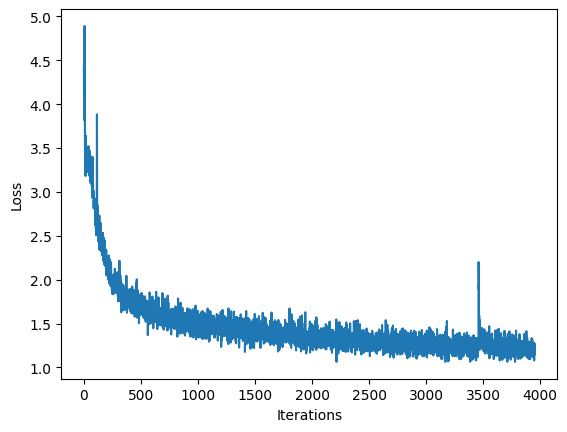

 99%|█████████▉| 3957/4000 [02:18<00:01, 24.62it/s]

[ 83285  12249 156713 151617  18454 154863  28000 144462]
[191484 183421 189104 156825  82536 150750  27424 101674]
[ 50226  28042  26156  20947  20464 122690  66293  66757]
[121395   7734 119387 144554 148186 119542  28745 122034]
[142131 152744 179090 141776 126945  24655  10384 112465]
[132631  24905 134442 150888  94956  42712  85406  29651]
[ 42749  24545  73234  94871  18258 187085  70236  82437]


 99%|█████████▉| 3965/4000 [02:18<00:01, 28.36it/s]

[174561  72759 182904 180043  19723  34051 105496  89441]
[168179  83922  67525 134555  65518  34997 142098  23669]
[ 60179 136941  78752  70498  85755 178897  98422 129077]
[  8854 167017  26861 112323 181553  37802 178759  63227]
[ 37031 171645  18128   3992   7448 166113   8562  34264]
[ 58236 178258 192368 126574 167061    484  57471 121638]
[179237 100628  11391 106514 163697  10652  23388  70378]


 99%|█████████▉| 3973/4000 [02:18<00:00, 30.68it/s]

[ 98697 119869  48716  60743 101495  13831  10710 169821]
[144722   5612  88372 167204  20422  34115  88685  75802]
[ 84583    857   9901  55334 122871 100695  83648 118325]
[141968  73854 170977 110256  24038  61868  17109 192963]
[126995 102704 166019 109518 186654  75529 145232  33924]
[144191 108338  69004   4770   4328  31367  58128  87000]
[148209  45210  98896  76300  64963  94745  88144 116838]


 99%|█████████▉| 3977/4000 [02:18<00:00, 31.33it/s]

[  2664  35160 130139  93250  28476  11626 193726  66257]
[  6442  90516  87354  31957 155604  11030  99026  20305]
[117226  86714   1205 132439 104270  43034  93384 154018]
[ 64166 182676   6794  22481 145401 196865  87342  53163]
[ 11772 103937 111436 118698 159782 178313  88838  63955]
[ 35282 105875 198507  61805 127238  65271 117742  88110]
[128156  25068 178558 169375  38106  91797  94233  69165]


100%|█████████▉| 3985/4000 [02:19<00:00, 31.69it/s]

[162713 117376  65739  91241 109775 179174  82519 173942]
[189841 149233   6211 115910 154139 166722   3453  89963]
[148339  63150   1015 163356 154332  74784 142272  65748]
[142597  91549 199945  27206   4465 194275 160121  78795]
[183031  33955  33828 130549 195537  49904   7376 127479]
[142784   9948  29248 181594 192291   2039 133871 135930]
[135931  57748 125798 126771 163315  60977  79333  66576]


100%|█████████▉| 3993/4000 [02:19<00:00, 32.39it/s]

[ 41923 125132 126074  65750  88046  54695  95747  84583]
[155028  27853 105772  78466   4329 166572 195030  75764]
[142669 123212 127929 122508 120739 158452 119323 174918]
[ 87154  37345 139776  62016 120099 107735  96227 199382]
[14880 16321 54877 42135 35572 29743   899 69982]
[ 38428  91776  84755  14301 167351   4088  41225  72860]
[116662 122868  69852  41745  72301 149739 160105  96045]


100%|██████████| 4000/4000 [02:19<00:00, 28.68it/s]

[162203 123191  78334  11435 189935   4189 159515 145192]
[116603  79641 194804 165615  26333  31530 139400  62361]
[188940 166450 146848  12627 176650   5565  53799 153951]
[100433   4144 140256 150252   2889  74420 117283 118847]
[ 20823  69071 169524 157447 185083  68863 198170  96968]



COMET INFO: Uploading 201 metrics, params and output messages


True

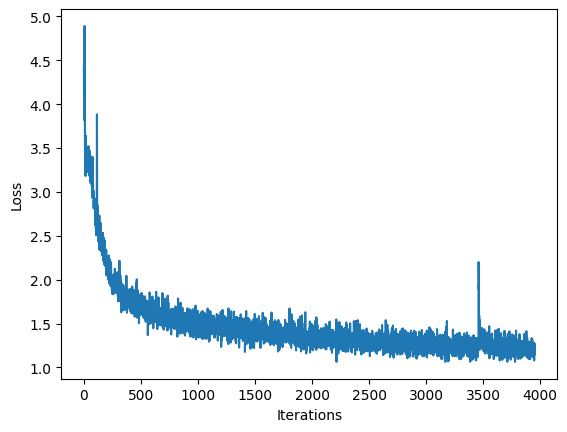

In [33]:
## Define optimizer and training operation

model = build_model(vocab_size, params["embedding_dim"], params["rnn_units"], params["batch_size"])

optimizer = tf.keras.optimizers.Adagrad(params["learning_rate"])

@tf.function
def train_step(x, y):
    with tf.GradientTape() as tape:
        y_hat = model(x)
        loss = compute_loss(y, y_hat)
    grads = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return loss

### Begin training
history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel="Iterations", ylabel="Loss")
experiment = create_experiment()

if hasattr(tqdm, "_instances"): tqdm._instances.clear()
for iter in tqdm(range(params["num_training_iterations"])):
    # Grab a batch and propagate it through the network
    x_batch, y_batch = get_batch(vectorized_songs, params["seq_length"], params["batch_size"])
    loss = train_step(x_batch, y_batch)

    # log the loss to the Comet interface! we will be able to track it there.
    experiment.log_metric("loss", loss.numpy().mean(), step=iter)
    # Update the progress bar and also visualize within notebook
    history.append(loss.numpy().mean())
    plotter.plot(history)

    # Update the model with the changed weights!
    if iter % 100 == 0:
        model.save_weights(checkpoint_prefix)

# Save the trained model and the weights
model.save_weights(checkpoint_prefix)
experiment.flush()

In [34]:
## Rebuild the model using a batch_size=1
model = build_model(vocab_size, params["embedding_dim"], params["rnn_units"], batch_size=1)


# Restore the model weights for the last checkpoint after training
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (1, None, 256)            21248     
                                                                 
 lstm_5 (LSTM)               (1, None, 1024)           5246976   
                                                                 
 dense_5 (Dense)             (1, None, 83)             85075     
                                                                 
Total params: 5353299 (20.42 MB)
Trainable params: 5353299 (20.42 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [35]:
### Prediction of a generated song ###

def generate_text(model, start_string, generation_length=1000):
  # Evaluation step (generating ABC text using the learned RNN model)

  input_eval = [char2idx[s] for s in start_string]

  input_eval = tf.expand_dims(input_eval, 0)

  # Empty string to store our results
  text_generated = []

  # Here batch size == 1
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(generation_length)):
      # evaluate the inputs and generate the next character predictions
      predictions = model(input_eval)


      # Remove the batch dimension
      predictions = tf.squeeze(predictions, 0)

      # use a multinomial distribution to sample
      predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()

      # Pass the prediction along with the previous hidden state
      #   as the next inputs to the model
      input_eval = tf.expand_dims([predicted_id], 0)

      # add the predicted character to the generated text!
      text_generated.append(idx2char[predicted_id]) 
      

  return (start_string + ''.join(text_generated))

In [36]:
generated_text = generate_text(model, start_string="X", generation_length=1000)

100%|██████████| 1000/1000 [00:08<00:00, 116.50it/s]


In [37]:
### Play back generated songs ###

generated_songs = mdl.lab1.extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs):
  # Synthesize the waveform from a song
  waveform = mdl.lab1.play_song(song)

  # If its a valid song (correct syntax), lets play it!
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)

    numeric_data = np.frombuffer(waveform.data, dtype=np.int16)
    wav_file_path = f"output_{i}.wav"
    write(wav_file_path, 88200, numeric_data)

    # save your song to the Comet interface -- you can access it there
    experiment.log_asset(wav_file_path)

Found 5 songs in text
Generated song 1


Generated song 2


In [38]:
# when done, end the comet experiment
experiment.end()

COMET WARNING: Couldn't retrieve Google Colab notebook content
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : clear_volcano_343
COMET INFO:     url                   : https://www.comet.com/tnhi26990/6s191-lab1-part2/94c24bd9cad24ab39aca5ba04299ca93
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     loss [4000] : (1.0623013973236084, 4.892322540283203)
COMET INFO:   Parameters:
COMET INFO:     batch_size              : 8
COMET INFO:     embedding_dim           : 256
COMET INFO:     learning_rate           : 0.005
COMET INFO:     num_training_iterations : 4000
COMET INFO:     rnn_units               : 1024
COMET INFO:     seq_length              : 100
COMET INFO:   Uploads:
COMET INFO:     